# Рынок заведений общественного питания Москвы

<u>**Задача проекта:**</u>
исследование рынка общепита Москвы: поиск интересных особенностей и презентация полученных результатов инвесторам для выбора подходящего места и формата заведения.

<u>**План работы:**</u>
    
* Загрузка  и изучение данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года
* Предобработка данных
* Анализ данных
* Детализация исследования: открытие кофейни
* Презентация исследования для инвесторов

In [1]:
!pip install folium

Defaulting to user installation because normal site-packages is not writeable


In [2]:
!pip install -U kaleido

Defaulting to user installation because normal site-packages is not writeable


In [3]:
import pandas as pd
import numpy as np
from numpy import median
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
import math as mth
import datetime as dt
import os
from plotly import graph_objects as go
import plotly.io as pio
pio.renderers.default = "png"
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import folium
from folium.plugins import MarkerCluster
import json
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster
from math import radians, cos, sin, asin, sqrt


plt.rcParams["figure.figsize"] = (19,10)

## Загрузка данных и изучение общей информации

In [4]:
path1 = '/datasets/moscow_places.csv'
path2 = '/Users/user/Desktop/Проекты Практикума/datasets/moscow_places.csv'

if os.path.exists(path1):
    places = pd.read_csv(path1)
elif os.path.exists(path2):
    places = pd.read_csv(path2)
else:
    print('Ошибка в чтении файла')

In [5]:
display(places.head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [6]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вывод

В датасете представлены следующие данные:
1. количество заведений  - 8406 (8406 строк в датасете)
2. датасет содержит 13 столбцов
3. в 6 столбцах есть пропущенные значения
4. датасет содержит текстовые типы данных и числовые (целочисленные и дробные)  

Столбцы содержат следующую информацию:
* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона
* `middle_avg_bill` — число с оценкой среднего чека (только для значений из столбца avg_bill)
* `middle_coffee_cup` — число с оценкой одной чашки капучино (только для значений из столбца avg_bill)
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым 
* `district` — административный район, в котором находится заведение
* `seats` — количество посадочных мест

## Предобработка данных

### Поиск и обработка дубликатов

In [7]:
places.duplicated().sum()

0

In [8]:
places[['name', 'category', 'address']].duplicated().sum()

0

In [9]:
places['address'].duplicated().sum()

2653

In [10]:
places[['name', 'address']].duplicated().sum()

0

Приведем все названия заведений к нижнему регистру и еще раз проверим на наличие неявных дубликатов по столбцам `name`+`address`.
Чтобы не изменять исходные названия заведений, будем работать со срезами таблицы и далее вносить изменения в исходном датафрейме.

In [11]:
places_dupl = places[['name', 'address']]
places_dupl['name'] = places_dupl['name'].str.lower()
places_dupl2 = places_dupl[places_dupl.duplicated()]
display(places_dupl2)

,name,address
1511,more poke,"Москва, Волоколамское шоссе, 11, стр. 2"
2420,раковарня клешни и хвосты,"Москва, проспект Мира, 118"
3109,хлеб да выпечка,"Москва, Ярцевская улица, 19"


Обнаружено 3 неявных дубликата по признаку `name`+`address`. Удалим данные строки по индексу из основного датафрейма.

In [12]:
places = places.drop(index=[1511, 2420, 3109])
places.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB


#### Вывод
Явных строк-дубликатов в датасете не выявлено. Есть дублирующие названия и дублирующие адреса заведений. Это может быть вызвано тем, что по одному и тому же адресу могут располагаться несколько заведений, а наименования заведений могут повторяться либо это могут быть завдения одной сети.

Найдены 3 дублирующие значения "название + адрес". Они были удалены из основного датафрейма.

### Поиск и обработка пропущенных значений

In [13]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

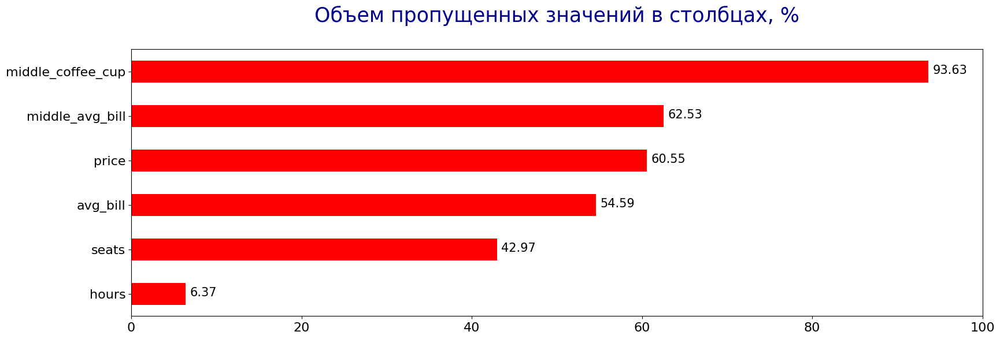

In [14]:
#визуализируем количество пропущенных значений

def missed_values(df):
    fig, ax = plt.subplots(figsize=(19, 6))
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns={0: 'space'})
            .query('space > 0')
            .sort_values(by='space', ascending=True)
            .plot(kind='barh', legend=False, fontsize=16, ax=ax, color='red')
            .set_title('Объем пропущенных значений в столбцах, %' + "\n", fontsize=25, color='darkblue')
        );
        plt.xlim(0, 100)
        
        for i in ax.patches:
            plt.text(i.get_width()+0.5, i.get_y()+0.2,
                     str(round((i.get_width()), 2)),
                     fontsize=15, 
                     color='black')
        
    except:
        print('Пропущенных значений не выявлено')

missed_values(places)

In [15]:
#пропуски в столбце hours заменим на "0", чтобы тип данных не менялся и можно было работать с данными
#пропуски в столбцах price, avg_bill заменим на "нет данных", 
#чтобы тип данных object не менялся и можно было работать с данными

places['hours'] = places['hours'].fillna(value='0')
column_list = ['price', 'avg_bill']
for column in column_list:
    places[column] = places[column].fillna(value='нет данных')


In [16]:
#столбец chain переведем из числового формата в формат логический (boolean)

places['chain'] = places['chain'].astype(bool)

#### Вывод
Объемы пропущенных значений в столбцах, связанных с ценами, достаточно высокие: от 54% и выше. 
Есть следующие варианты решения:
1. Заполнить данные из открытых источников (например, сайт заведения, оценки пользователей и пр.). Но данный вариант трудоемкий и может быть неоправдан (данные могут быть доступны в недостаточном объеме).
2. Заполнить пропущенные значения медианными значениями таких же заведений по категории и административному району. В таком случае существует риск заполнить большой объем информации (от 54 до почти 94%) агрегированными данными, которые могут не совпадать с реальной картиной. В результате можем получить отчет с большими погрешностями, т.е. с ошибочными данными и выводами.
3. **Оставить пропущенные значения в исходном виде. Это решение мы и применили. Это позволяет нам анализировать реальные данные заведений.** Единственное, мы заменили пропущенные значения на значение типа object 'нет данных' в столбцах `price`, `avg_bill`, чтобы значения NaN, None технически не мешали в дальнейшей обработке данных.

Также выявлено большое количество пропусков в столбце `seats`. По аналогии со столбцами, связанными с ценами, мы оставляем пропущенные значения в столбцах `seats` в исходном виде. 

Столбец `hours` мы также оставляем в исходном виде, только заменяем пропущенные значения на значения "0" типа object.

Для удобства чтения столбца, а также для удобства дальнейшего анализа, тип данных в столбце `chain` поменяли с числового на логический boolean.

### Создание дополнительных столбцов

**Создаем столбец `street` с названиями улиц из столбца с адресом**

In [17]:
places['street'] = places['address'].str.split(', ', expand=True)[1]
display(places[['name', 'street']].head())


,name,street
0,WoWфли,улица Дыбенко
1,Четыре комнаты,улица Дыбенко
2,Хазри,Клязьминская улица
3,Dormouse Coffee Shop,улица Маршала Федоренко
4,Иль Марко,Правобережная улица


**Создаем столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):**
* логическое значение True — если заведение работает ежедневно и круглосуточно;
* логическое значение False — в противоположном случае.

In [18]:
places['hours'].nunique()

1307

In [19]:
hours24_7 = pd.Series(places['hours'].unique().tolist())

for item in hours24_7:
    if 'ежедневно' in item:
        print(item)

ежедневно, 10:00–22:00
ежедневно, 09:00–22:00
ежедневно, 10:00–23:00
ежедневно, 12:00–00:00
ежедневно, круглосуточно
ежедневно, 10:00–21:00
ежедневно, 08:00–22:00
ежедневно, 13:00–00:00
ежедневно, 09:00–21:00
ежедневно, 10:00–19:00
ежедневно, 08:00–21:00
ежедневно, 09:00–23:00
ежедневно, 08:00–23:00
ежедневно, 11:00–00:00
ежедневно, 09:00–02:00
ежедневно, 12:00–23:00
ежедневно, 12:00–03:00
ежедневно, 16:00–06:00
ежедневно, 09:00–01:00
ежедневно, 11:00–23:00
ежедневно, 09:00–06:00
ежедневно, 10:00–21:30
ежедневно, 08:00–00:00
ежедневно, 06:00–20:00
ежедневно, 10:00–20:00
ежедневно, 11:00–22:00
ежедневно, 10:30–23:00
ежедневно, 07:00–00:00
ежедневно, 10:00–22:00, перерыв 16:00–16:20
ежедневно, 13:00–04:00
ежедневно, 11:00–19:00
ежедневно, 16:00–04:00
ежедневно, 09:00–00:00
ежедневно, 10:00–01:00
ежедневно, 11:00–22:30
ежедневно, 07:30–00:30
ежедневно, 08:30–23:30
ежедневно, 13:00–01:00
ежедневно, 11:00–06:00
ежедневно, 07:00–23:00
ежедневно, 18:00–05:00
ежедневно, 11:00–21:30
ежедневно, 

График работы "ежедневно и круглосуточно" обозначено в столбце `hours` только одним значением - **'ежедневно, круглосуточно'**

In [20]:
#создаем функцию для категоризации заведений на работающих 24/7 и остальных. Присваиваем им лог. значения True и False.

def categorize_hours(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    else:
        return False

places['is_24/7'] = places['hours'].apply(categorize_hours)
    

In [21]:
display(places.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет данных,нет данных,NaN,NaN,False,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет данных,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,Правобережная улица,False


## Анализ данных

### Распределение заведений по категориям

In [22]:
category = places.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
display(category)

,category,name
0,кафе,2377
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


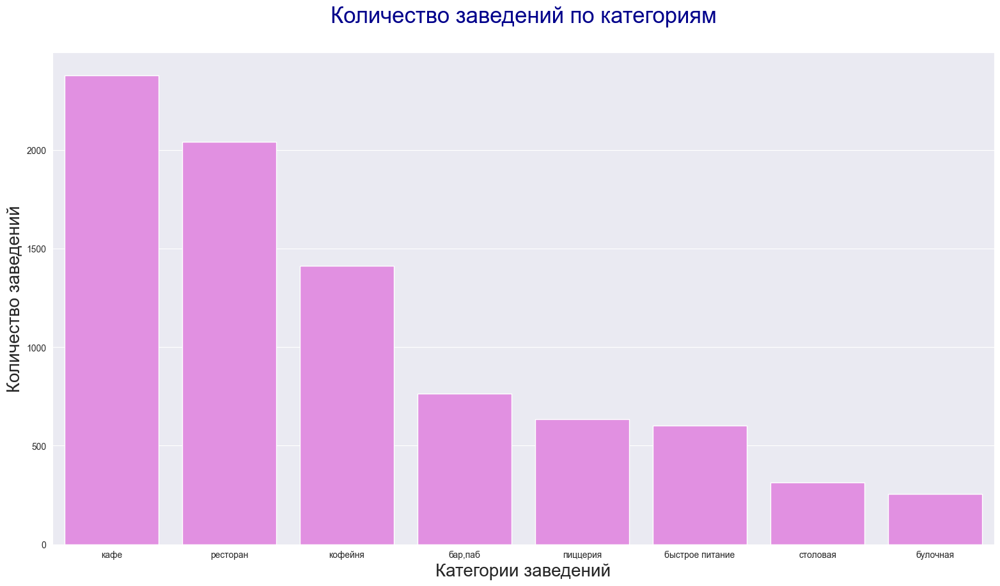

In [23]:
sns.set_style('darkgrid')
sns.barplot(x='category', y='name', data=category, color='violet')
plt.xlabel('Категории заведений', fontsize=20)
plt.ylabel('Количество заведений', fontsize=20)
plt.title('Количество заведений по категориям' + "\n", fontsize=25, color='darkblue');

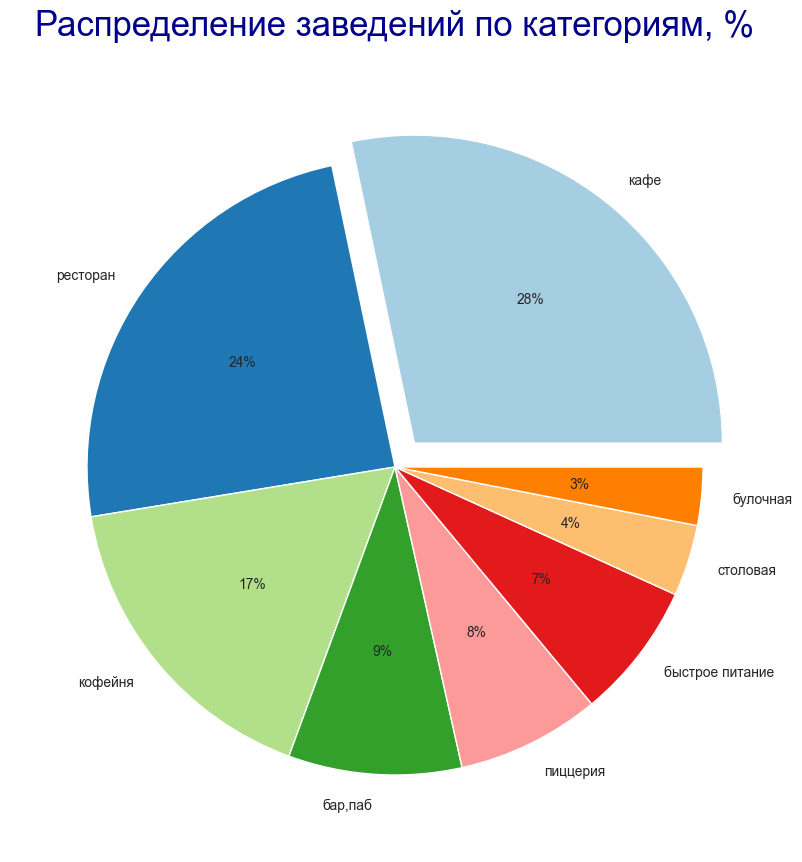

In [24]:
colors = sns.color_palette("Paired")
explode = [0.1, 0, 0, 0, 0, 0, 0, 0]
plt.pie(category['name'], labels = category['category'], colors = colors, autopct='%.0f%%', explode=explode)
plt.title('Распределение заведений по категориям, %' + "\n", fontsize=25, color='darkblue')
plt.show()

#### Вывод

Заведения в данном датасете представлены в 8 категориях и распределены следующим образом:

|Место|Категория|Доля%|
|--|--|--|
|1|Кафе|28%|
|2|Ресторан|24%|
|3|Кофейня|17%|
|4|Бар,паб|9%|
|5|Пиццерия|8%|
|6|Быстрое питание|7%|
|7|Столовая|4%|
|8|Булочная|3%|

Как мы видим, уверенно лидируют такие категории как кафе, ресторан и кофейни. Остальные 5 категорий составляют в сумме 31% от объема заведений, каждый из них - менее 10%.


### Количество посадочных мест в местах по категориям

In [25]:
ranks = places.groupby('category')['seats'].median().sort_values()[::-1].index

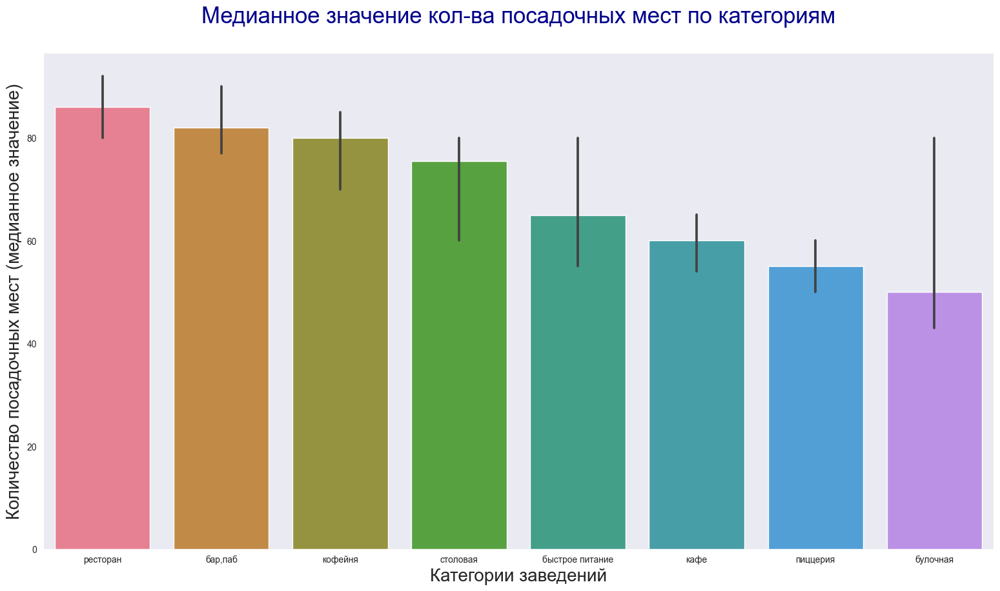

In [26]:
with sns.color_palette("husl", 9):
        sns.set_style('dark')
        sns.barplot(x='category', y='seats', data=places, estimator=median, order=ranks)
        plt.xlabel('Категории заведений', fontsize=20)
        plt.ylabel('Количество посадочных мест (медианное значение)', fontsize=20)
        plt.title('Медианное значение кол-ва посадочных мест по категориям' + "\n", fontsize=25, color='darkblue');

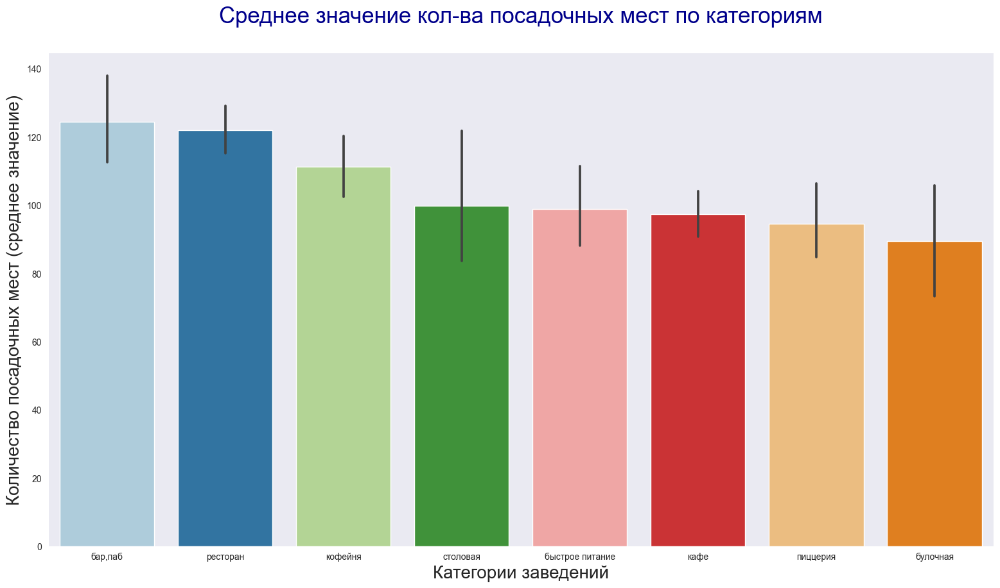

In [27]:
ranks_mean = places.groupby('category')['seats'].mean().sort_values()[::-1].index
with sns.color_palette("Paired"):
    sns.set_style('dark')
    sns.barplot(x='category', y='seats', data=places, order=ranks_mean)
    plt.xlabel('Категории заведений', fontsize=20)
    plt.ylabel('Количество посадочных мест (среднее значение)', fontsize=20)
    plt.title('Среднее значение кол-ва посадочных мест по категориям' + "\n", fontsize=25, color='darkblue');

Сравним количество посадочных мест заведений по категориям

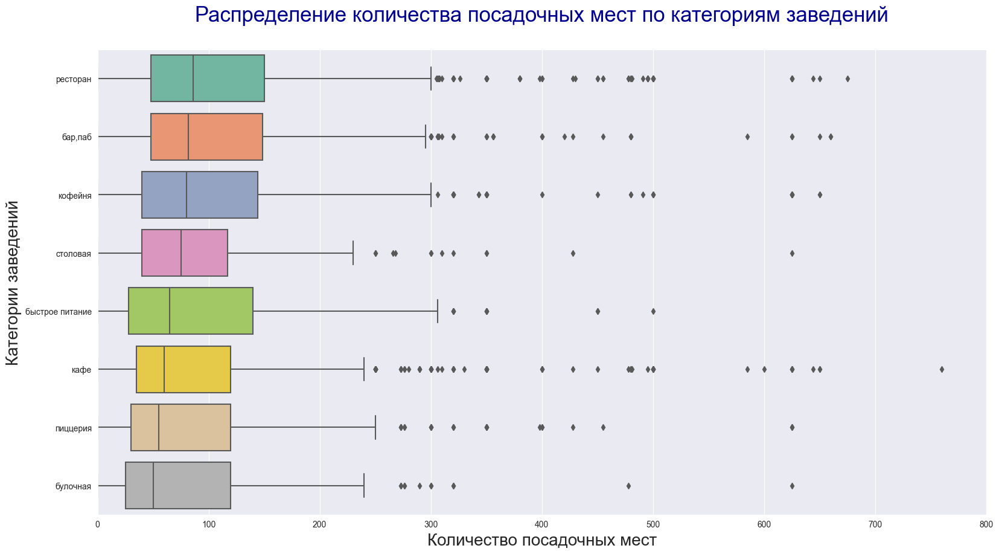

In [28]:
with sns.color_palette("Set2"):
    sns.set_style('darkgrid')
    sns.boxplot(x='seats', y='category', data=places, order=ranks)
    plt.xlim(0, 800)
    plt.xlabel('Количество посадочных мест', fontsize=20)
    plt.ylabel('Категории заведений', fontsize=20)
    plt.title('Распределение количества посадочных мест по категориям заведений' + "\n", fontsize=25, color='darkblue');

In [29]:
categories = ["бар,паб", "булочная", "быстрое питание", "кафе", "кофейня", "пиццерия", "ресторан", "столовая"]

for cat in categories:
    Q1 = places[places['category'] == cat]['seats'].quantile(0.25)
    Q3 = places[places['category'] == cat]['seats'].quantile(0.75)
    display(f'Категория {cat} Q1: {Q1}, Q3: {Q3}')

'Категория бар,паб Q1: 48.0, Q3: 148.5'

'Категория булочная Q1: 25.0, Q3: 120.0'

'Категория быстрое питание Q1: 28.0, Q3: 140.0'

'Категория кафе Q1: 35.0, Q3: 120.0'

'Категория кофейня Q1: 40.0, Q3: 144.0'

'Категория пиццерия Q1: 30.0, Q3: 120.0'

'Категория ресторан Q1: 48.0, Q3: 150.0'

'Категория столовая Q1: 40.0, Q3: 117.0'

#### Вывод

Диаграмма размаха категорий заведения по количеству посадочных мест демонстрирует значительное количество выбросов. Исходя из этого, целесообразно учитывать не средние значения количества посадочных мест, а медианные.

Ориентируясь на медианные значения, количество посадочных мест (от большего к меньшему) распределилось следующим образом:
1. ресторан - 85 посадочных мест
2. бар, паб - 83 посадочных места
3. кофейня - 80 посадочных мест
4. столовая - 78 посадочных мест
5. быстрое питание - 65 посадочных мест
6. кафе - 60 посадочных мест
7. пиццерия - 57 посадочных мест
8. булочная - 50 посадочных мест

**Половина значений количества посадочных мест по категориям распределены следующим образом:**

|Место|Категория|Диапазон 50% значений посадочных мест|
|--|--|--|
|1|Ресторан|от 48 до 150 посадочных мест|
|2|Бар,паб|от 48 до 150 посадочных мест|
|3|Кофейня|от 40 до 144 посадочных мест|
|4|Быстрое питание|от 28 до 140 посадочных мест|
|5|Кафе|от 35 до 120 посадочных мест|
|6|Пиццерия|от 30 до 120 посадочных мест|
|7|Булочная|от 25 до 150 посадочных мест|
|8|Столовая|от 40 до 117 посадочных мест|

Следовательно, 3 категории заведений в большинстве своем имеют наибольшие посадочные места, это
1. Ресторан
2. Бар,паб
3. Кофейня



###  Cоотношение сетевых и несетевых заведений 

Найдем общие значения количества сетевых и несетевых заведений

In [30]:
chains = places.groupby('chain')['name'].count().reset_index()
chains.columns = ['chain','count']
chains['share'] = np.round(chains['count']*100/chains['count'].sum())
display(chains);

,chain,count,share
0,False,5200,62.0
1,True,3203,38.0


Рассмотрим визуально соотношение сетевых и несетевых заведений

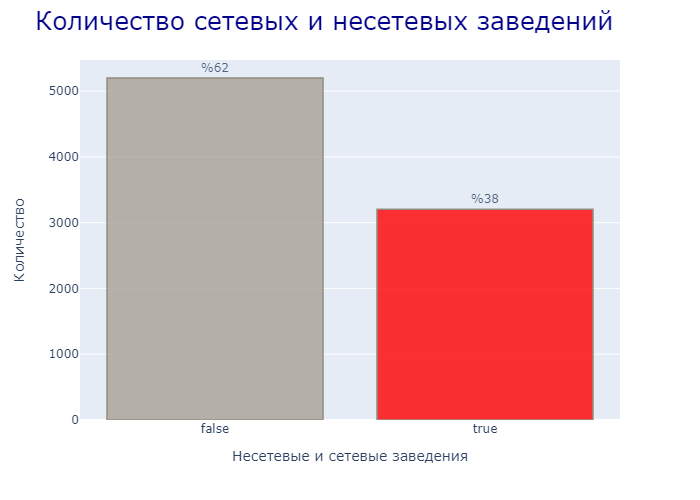

In [31]:
fig = px.bar(chains, x='chain', y='count', text='share')
fig.update_layout(xaxis_title='Несетевые и сетевые заведения',
                 yaxis_title='Количество')
fig.update_layout(dict(title='Количество сетевых и несетевых заведений' + '\n', titlefont_size=25, titlefont_color='darkblue'))
fig.update_traces(texttemplate='%%{text}', textposition='outside')
fig.update_traces(marker_color=['rgb(168, 161, 150)', 'rgb(254, 0, 0)'], marker_line_color='rgb(125, 116, 99)',
                  marker_line_width=1.5, opacity=0.8)
fig.show()

Посмотрим какие заведения чаще являются сетевыми

In [32]:
places_chain = places.pivot_table(index=['category', 'chain'], values='name', aggfunc='count').reset_index()
places_chain.columns = ['category', 'chain', 'count']
places_chain['chain'] = places_chain['chain'].astype(bool)
display(places_chain)

,category,chain,count
0,"бар,паб",False,596
1,"бар,паб",True,168
2,булочная,False,99
3,булочная,True,157
4,быстрое питание,False,371
5,быстрое питание,True,232
6,кафе,False,1598
7,кафе,True,779
8,кофейня,False,693
9,кофейня,True,720


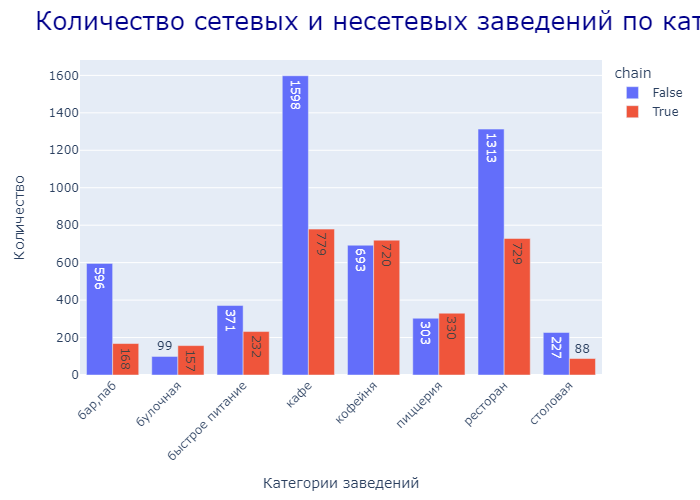

In [33]:

fig = px.bar(places_chain, x='category', y='count', color='chain', text='count', barmode='group')
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis_title='Категории заведений',
                 yaxis_title='Количество')
fig.update_layout(dict(title='Количество сетевых и несетевых заведений по категориям' + '\n', titlefont_size=25, titlefont_color='darkblue'))
fig.update_traces(texttemplate='%{text}')
fig.show() 

Посчитаем процентное соотношение сетевых заведений по каждой категории

In [34]:
places_chain2 = places.query('chain==False').pivot_table(index='category', values='name', aggfunc='count').reset_index()
places_chain2.columns=['category', 'chain_no']
places_chain3 = places.query('chain==True').pivot_table(index='category', values='name', aggfunc='count').reset_index()
places_chain3.columns=['category', 'chain_yes']

places_merged = places_chain2.merge(places_chain3, on='category', how='left')


places_merged['share_chain_yes'] = np.round(places_merged['chain_yes']*100/(places_merged['chain_no'] + places_merged['chain_yes']))
places_merged = places_merged.sort_values(by='share_chain_yes', ascending=False).reset_index(drop=True)
display(places_merged)

,category,chain_no,chain_yes,share_chain_yes
0,булочная,99,157,61.0
1,пиццерия,303,330,52.0
2,кофейня,693,720,51.0
3,быстрое питание,371,232,38.0
4,ресторан,1313,729,36.0
5,кафе,1598,779,33.0
6,столовая,227,88,28.0
7,"бар,паб",596,168,22.0


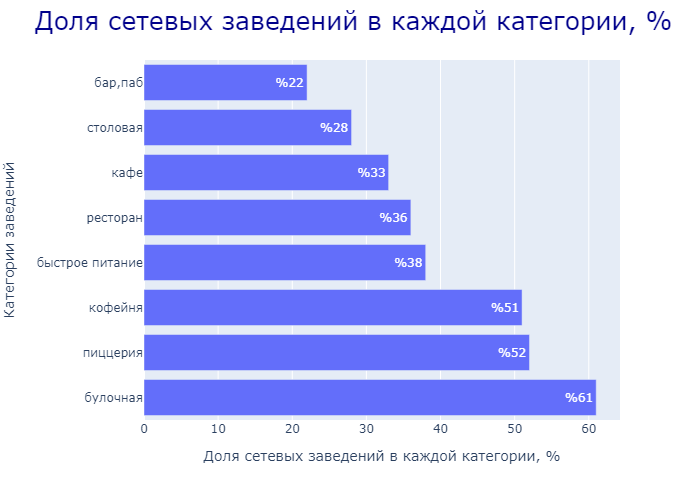

In [35]:
fig = px.bar(places_merged, x='share_chain_yes', y='category',
             text='share_chain_yes', orientation='h')
fig.update_layout(xaxis_title='Доля сетевых заведений в каждой категории, %',
                 yaxis_title='Категории заведений')
fig.update_layout(dict(title='Доля сетевых заведений в каждой категории, %' + '\n', titlefont_size=25, titlefont_color='darkblue'))
fig.update_traces(texttemplate='%%{text}')
fig.show() 

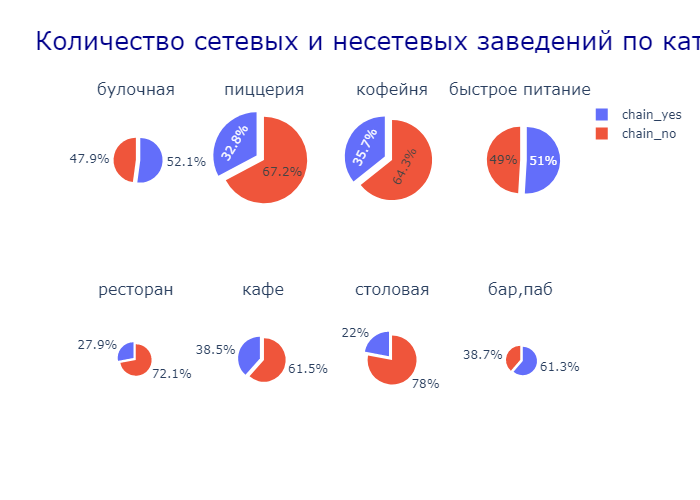

In [36]:
labels = places_merged.columns[1:3].tolist()

fig = make_subplots(2, 4, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}], 
                                 [{'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['булочная', 'пиццерия', 'кофейня', 'быстрое питание', 'ресторан', 'кафе', 
                                    'столовая', 'бар,паб'])
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[1].tolist(), scalegroup='one',
                     name="булочная", pull=[0, 0.2]), 1, 1)
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[5].tolist(), scalegroup='one',
                     name="пиццерия", pull=[0, 0.2]), 1, 2)
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[4].tolist(), scalegroup='one',
                     name="кофейня", pull=[0, 0.2]), 1, 3)
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[2].tolist(), scalegroup='one',
                     name="быстрое питание", pull=[0, 0.2]), 1, 4)
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[6].tolist(), scalegroup='one',
                     name="ресторан", pull=[0, 0.2]), 2, 1)
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[3].tolist(), scalegroup='one',
                     name="кафе", pull=[0, 0.2]), 2, 2)
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[7].tolist(), scalegroup='one',
                     name="столовая", pull=[0, 0.2]), 2, 3)
fig.add_trace(go.Pie(labels=labels, values=places_merged[['chain_no', 'chain_yes']].loc[0].tolist(), scalegroup='one',
                     name="бар,паб", pull=[0, 0.2]), 2, 4)

fig.update_layout(dict(title='Количество сетевых и несетевых заведений по категориям' + '\n', titlefont_size=25, titlefont_color='darkblue'))
fig.show()



#### Вывод

1. Большая часть заведений явялются несетевыми - 62%.
2. Доля сетевых заведений составляет 38%

Среди сетевых заведений преобладающая часть это заведения категорий кафе, рестораны и кофейня. 

В абсолютном выражении количество сетевых заведений по категориям распределено в следующем порядке:

|категория|количество|
|--|--|
|1. кафе | 779 заведений|
|2. ресторан | 730 заведений|
|3. кафейня | 720 заведений |
|4. пиццерия | 330 заведений |
|5. быстрое питание | 232 заведения |
|6. бар,паба | 169 заведений |
|7. булочная | 157 заведений |
|8. столовая | 88 заведений |

Доля сетевых заведений в каждой категории:
* **62.3% булочных** являются сетевыми.
* также существенные доли у категорий **пиццерия - 52.1%**
* **кофейня - 51%**
* далее идут категории **быстрое питание - 38.5%**
* **ресторан - 35.7%**
* **кафе - 32.8%**
* самые низкие доли сетевых заведений наблюдатся у следующих категорий **столовая - 27.9%**
* **бар,паб - 22.1%**

Таким образом, **в 3-категориях заведений - булочные, пиццерии и кофейни, более 50% заведений являются сетевыми.**


### Анализ сетевых заведений по названиям

**Найдем данные по названиям заведений и топ-15 популярных сетей в Москве**

In [37]:
places_names = places.query('chain == True').pivot_table(index='name', values = 'address', aggfunc = 'count')\
.reset_index().sort_values(by='address', ascending=False)
places_names = places_names.reset_index().loc[:14]
display(places_names)

,index,name,address
0,746,Шоколадница,120
1,344,Домино'с Пицца,76
2,340,Додо Пицца,74
3,148,One Price Coffee,71
4,759,Яндекс Лавка,69
5,59,Cofix,65
6,170,Prime,50
7,679,Хинкальная,44
8,378,КОФЕПОРТ,42
9,431,Кулинарная лавка братьев Караваевых,39


In [38]:
places_categories_names = places.query('chain == True').pivot_table(index=['name', 'category'], values = 'address', aggfunc = 'count')\
.reset_index()
places_names = places_names.merge(places_categories_names, on='name', how='left')
places_names.drop(['index', 'address_x'], axis=1, inplace=True)
display(places_names)

,name,category,address_y
0,Шоколадница,кафе,1
1,Шоколадница,кофейня,119
2,Домино'с Пицца,пиццерия,76
3,Додо Пицца,пиццерия,74
4,One Price Coffee,кофейня,71
5,Яндекс Лавка,ресторан,69
6,Cofix,кофейня,65
7,Prime,кафе,1
8,Prime,ресторан,49
9,Хинкальная,"бар,паб",3


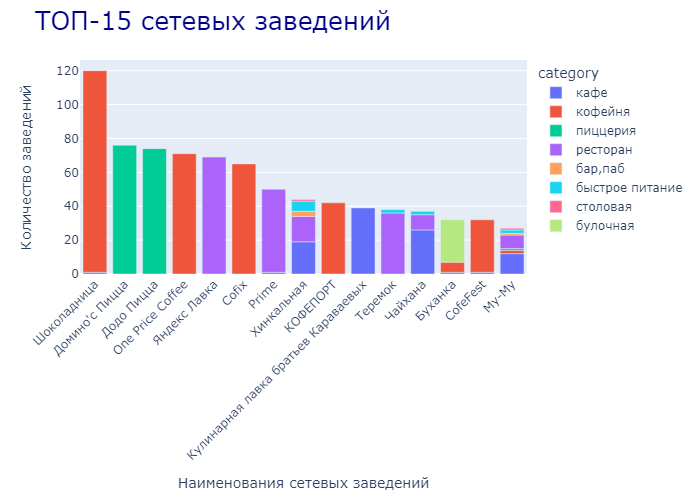

In [39]:
fig = px.bar(places_names, x="name", y="address_y", color='category')
fig.update_layout(dict(title='ТОП-15 сетевых заведений' + '\n', titlefont_size=25, titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Наименования сетевых заведений',
                 yaxis_title='Количество заведений')
fig.update_layout(xaxis = {"categoryorder": "total descending"})
fig.update_xaxes(tickangle=-45)
fig.show()

#### Вывод

Мы выделили ТОП-15 крупных сетей, где встречаются как заведения одной категории, так и разных.
Названия сетей во многом знакомые широкому кругу потребителей. Список ТОП-15 сетей по количеству заведений (от наибольшего к меньшему):
1. Шоколадница
2. Длмино'с Пицца
3. Додо Пицца
4. One Price Coffee
5. Яндекс Лавка
6. Cofix
7. Prime
8. Хинкальная
9. КОФЕПОРТ
10. Кулинарная лавка братьев Караваевых
11. Теремок
12. Чайхана
13. CofeFest
14. Буханка
15. Му-Му

В данных ТОП-15 сетях преобладают завeдения категории **кофейня**, на втором месте - **ресторан**, на третьем - **пиццерия**. Менее всего встречаются заведения категории **столовая**.
    

### Количество заведений по административным округам Москвы

In [40]:
places_districts = places.pivot_table(index='district', columns='category', values='name', aggfunc='count')
places_districts['total'] = places_districts.sum(axis=1)
places_districts = places_districts.sort_values(by='total', ascending=False).reset_index()
display(places_districts)

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
0,Центральный административный округ,364,50,87,464,428,113,670,66,2242
1,Северный административный округ,68,39,58,235,193,77,188,41,899
2,Южный административный округ,68,25,85,264,131,73,202,44,892
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
4,Западный административный округ,50,37,62,238,150,71,218,24,850
5,Восточный административный округ,53,25,71,272,105,72,160,40,798
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
8,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


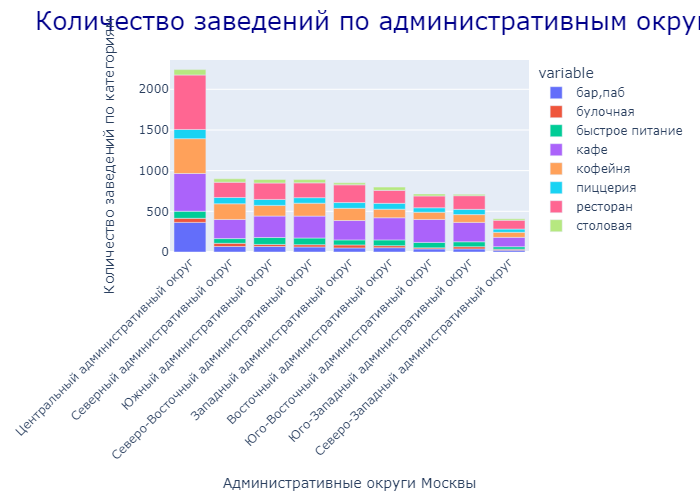

In [41]:
fig = px.bar(places_districts, x="district", y=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 
                                                'пиццерия', 'ресторан', 'столовая'],)
fig.update_layout(dict(title='Количество заведений по административным округам Москвы' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis_title='Административные округи Москвы',
                 yaxis_title='Количество заведений по категориям')
fig.show()

#### Вывод

Наблюдения показывают, что по количеству заведений лидирует ЦАО Москвы: количество заведений в ЦАО превышают количество заведений в других округах Москвы в среднем более чем 2 раза. 
Далее по порядку в идут САО, ЮАО, СВАО, ЗАО, ВАО, ЮВА, ЮЗАО, СЗАО.
В округах САО, ЮАО, СВАО, ЗАО, ВАО, ЮВА, ЮЗАО общее количество заведений варьируется 900-709 заведений. В округе СЗАО количество заведений самое низкое - 409. Это на 81.75% меньше чем в ЦАО и как минимум 42.3% меньше чем в остальных округах города Москвы.

По категориям заведений во всех округах, кроме ЦАО и САО, преобладают следующие категории заведений (порядок по количеству заведений)

        - кафе
        - ресторан
        - кофейня
        
        
В САО этот список выглядит следующим образом:

        - кафе
        - кофейня
        - ресторан
        
        
В ЦАО преобладают следующие категории заведений:

        - ресторан
        - кафе
        - кофейня
        - бар,паб

### Распределение средних рейтингов по категориям заведений

Визуализируем распределения средних рейтингов по категориям попарно, для удобства

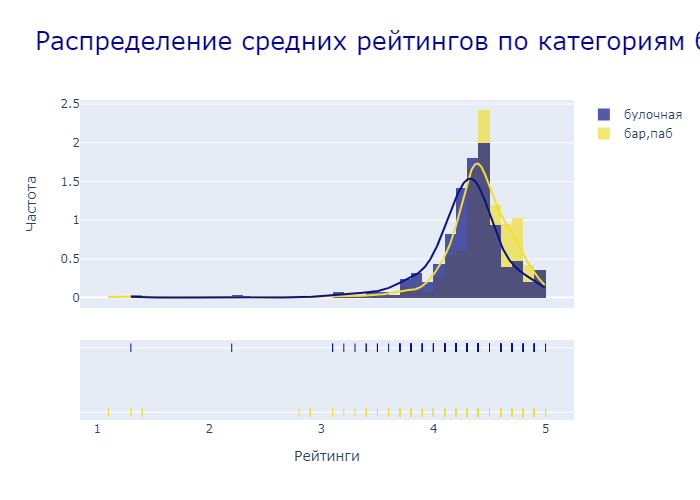

In [42]:
x1 = places.query('category=="бар,паб"')['rating']
x2 = places.query('category=="булочная"')['rating']
hist_data=[x1, x2]
group_labels = ['бар,паб', 'булочная']
colors = ['#F0DE36', '#0D1282']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1, colors=colors)
fig.update_layout(dict(title='Распределение средних рейтингов по категориям бар,паб/булочная' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Рейтинги',
                 yaxis_title='Частота')
fig.show()

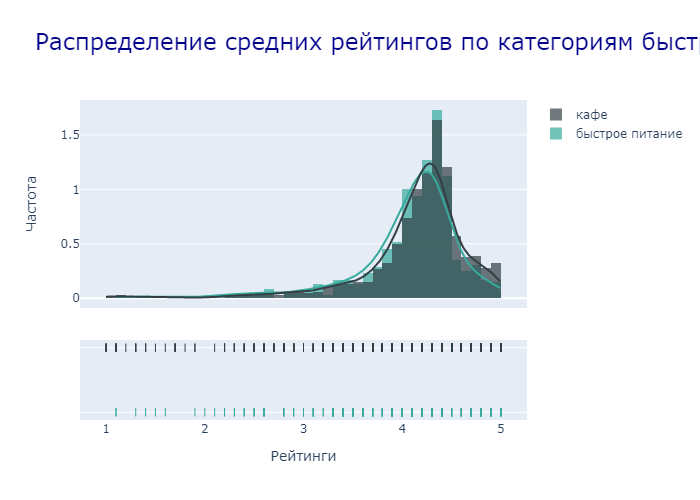

In [43]:
x3 = places.query('category=="быстрое питание"')['rating']
x4 = places.query('category=="кафе"')['rating']
hist_data=[x3, x4]
group_labels = ['быстрое питание', 'кафе']
colors=['#37AA9C', '#333F44']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1, colors=colors)
fig.update_layout(dict(title='Распределение средних рейтингов по категориям быстрое питание/кафе' + '\n', titlefont_size=23, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Рейтинги',
                 yaxis_title='Частота')
fig.show()

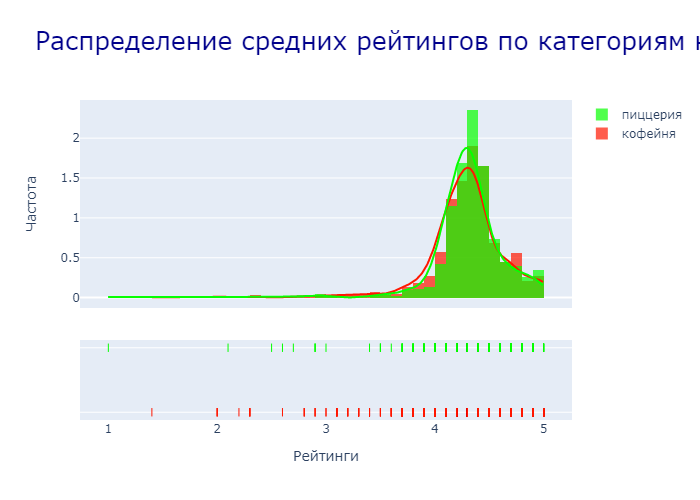

In [44]:
x5 = places.query('category=="кофейня"')['rating']
x6 = places.query('category=="пиццерия"')['rating']
hist_data=[x5, x6]
group_labels = ['кофейня', 'пиццерия']
colors = ['#FF1700', '#06FF00']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1, colors=colors)
fig.update_layout(dict(title='Распределение средних рейтингов по категориям кофейня/пиццерия' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Рейтинги',
                 yaxis_title='Частота')
fig.show()

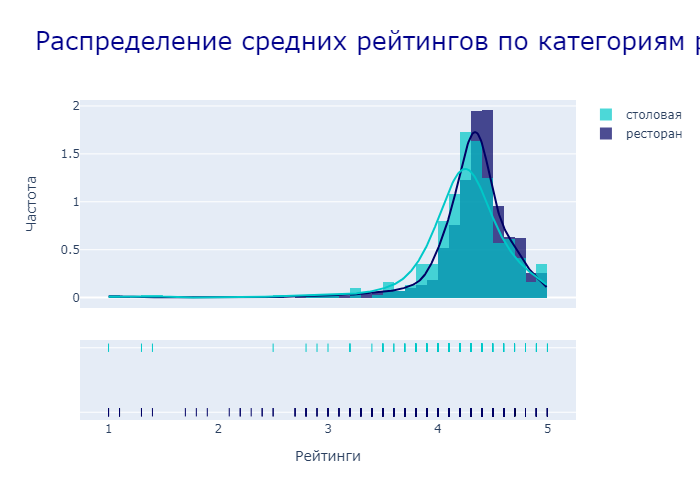

In [45]:
x7 = places.query('category=="ресторан"')['rating']
x8 = places.query('category=="столовая"')['rating']
hist_data=[x7, x8]
group_labels = ['ресторан', 'столовая']
colors = ['rgb(0, 0, 100)', 'rgb(0, 200, 200)']
fig = ff.create_distplot(hist_data, group_labels, bin_size=.1, colors=colors)
fig.update_layout(dict(title='Распределение средних рейтингов по категориям ресторан/столовая' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Рейтинги',
                 yaxis_title='Частота')
fig.show()

Во всех категориях мы видим выбросы по значениям рейтинга. Посмотрим отдельно на средние и медианные значения рейтингов в зависимости от категории заведений

In [46]:
categories = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']

rating_mean = []

for i in [x1, x2, x3, x4, x5, x6, x7, x8]:
    rating_mean.append(round(i.mean(), 2))
    
print(rating_mean)

[4.39, 4.27, 4.05, 4.12, 4.28, 4.3, 4.29, 4.21]


In [47]:
rating_median = []

for i in [x1, x2, x3, x4, x5, x6, x7, x8]:
    rating_median.append(i.median())
    
print(rating_median)

[4.4, 4.3, 4.2, 4.2, 4.3, 4.3, 4.3, 4.3]


In [48]:
rt = pd.DataFrame([rating_mean, rating_median], columns=categories, index=['Средний рейтинг', 'Медианный рейтинг'])
display(rt)

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
Средний рейтинг,4.39,4.27,4.05,4.12,4.28,4.3,4.29,4.21
Медианный рейтинг,4.40,4.30,4.20,4.20,4.30,4.3,4.30,4.30


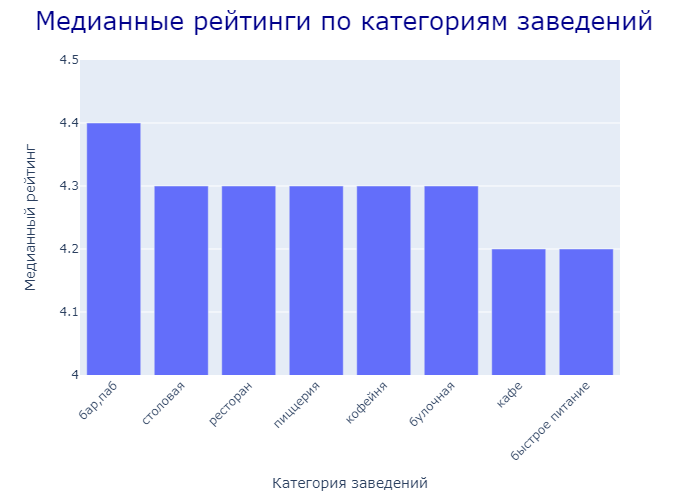

In [49]:
fig = px.bar(x=categories, y=rating_median)
fig.update_layout(dict(title='Медианные рейтинги по категориям заведений' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Категория заведений',
                 yaxis_title='Медианный рейтинг')
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.update_xaxes(tickangle=-45)
fig.update_layout(yaxis_range=[4,4.5])
fig.show()

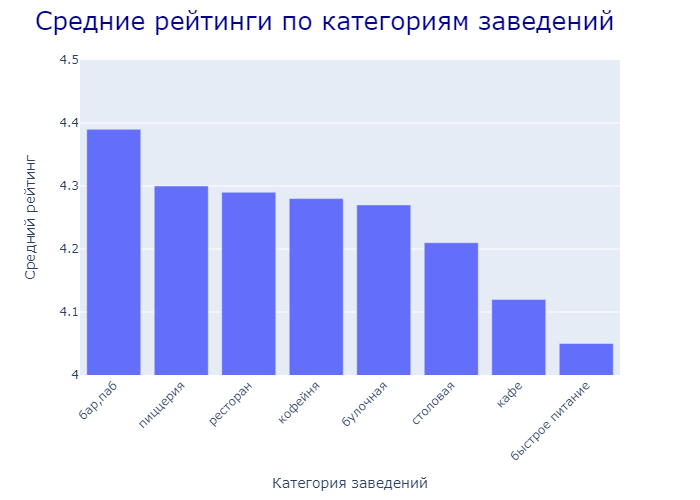

In [50]:
fig = px.bar(x=categories, y=rating_mean)
fig.update_layout(dict(title='Средние рейтинги по категориям заведений' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Категория заведений',
                 yaxis_title='Средний рейтинг')
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.update_xaxes(tickangle=-45)
fig.update_layout(yaxis_range=[4,4.5])
fig.show()

#### Вывод

При рассмотрении значений рейтингов заведений по категориям наблюдаются выбросы.
В данном разделе рассмотрели 2 параметра по рейтингам - средние значения рейтингов по каждой категории заведений и медианные значения. 

В оценке рейтингов целесообразно все же учитывать все рейтинги, в том числе и выбросы, поэтому мы будем оперировать в дальнейшем средними рейтингами.

Распределение средних рейтингов (от большего к меньшему) и медианных рейтингов по категориям:

|Место |Категория |Средний рейтинг|Медианный рейтинг|
|--|--|--|--|
|1  |бар,паб  | 4.39| 4.40|
|2  |пиццерия | 4.30| 4.30|
|3  |ресторан  | 4.29| 4.30|
|4  |кофейня | 4.28| 4.30|
|5  |булочная  | 4.27| 4.30|
|6  |столовая  | 4.21| 4.30|
|7  |кафе  | 4.12| 4.20|
|8  |быстрое питание | 4.05|4.20|


Таким образом, можно сдедать вывод, что **чаще всего высокие рейтинги получают заведения бар,паб, пиццерия, ресторан, кофейня и  булочная**. Заведения категорий столовая, кафе и быстрое питание реже получают высокие рейтинги.

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [51]:
ratings_dstr = places.groupby('district')['rating'].mean().reset_index()
display(ratings_dstr)

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.239822
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [52]:
#загрузим JSON-файл с границами округов Москвы
districts_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#создаем хороплет с помощью коструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data = districts_geo,
    data=ratings_dstr,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам Москвы'
    ).add_to(m)

m

### Все заведения датасета на карте, отображенные с помощью кластеров

In [53]:
marker_cluster=MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

places.apply(create_clusters, axis=1)

m

#### Вывод

На фоновой картограмме мы отобразили средние рейтинги заведений по административным округам и все заведения, которые были представлены в датасете.

Для удобства заведения отображены кластерами.

На фоновой картограмме отчетливо видно, что самый высокий средний рейтинг у заведений в ЦАО, самый низкий - ЮВАО.

### Топ-15 улиц по количеству заведений

In [54]:
#Найдем топ-15 улиц Москве по количеству заведений

places_street = places.pivot_table(index=['street'], values = 'name', aggfunc = 'count')\
.sort_values(by='name', ascending=False).reset_index().loc[:14]
display(places_street)

,street,name
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [55]:
places_street_category = places.pivot_table(index=['street', 'category'], values='name', aggfunc='count').reset_index()
display(places_street_category)

,street,category,name
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3817,шоссе Энтузиастов,кафе,10
3818,шоссе Энтузиастов,кофейня,7
3819,шоссе Энтузиастов,пиццерия,2
3820,шоссе Энтузиастов,ресторан,7


In [56]:
places_street = places_street.merge(places_street_category, on='street', how='left')
display(places_street)

,street,name_x,category,name_y
0,проспект Мира,183,"бар,паб",11
1,проспект Мира,183,булочная,4
2,проспект Мира,183,быстрое питание,21
3,проспект Мира,183,кафе,53
4,проспект Мира,183,кофейня,36
...,...,...,...,...
106,Пятницкая улица,48,быстрое питание,2
107,Пятницкая улица,48,кафе,7
108,Пятницкая улица,48,кофейня,6
109,Пятницкая улица,48,пиццерия,3


In [57]:
places_street.columns=['street', 'amount_of_names', 'category', 'amount_of_category']
places_stree=places_street.drop('amount_of_names', axis=1, inplace=True)

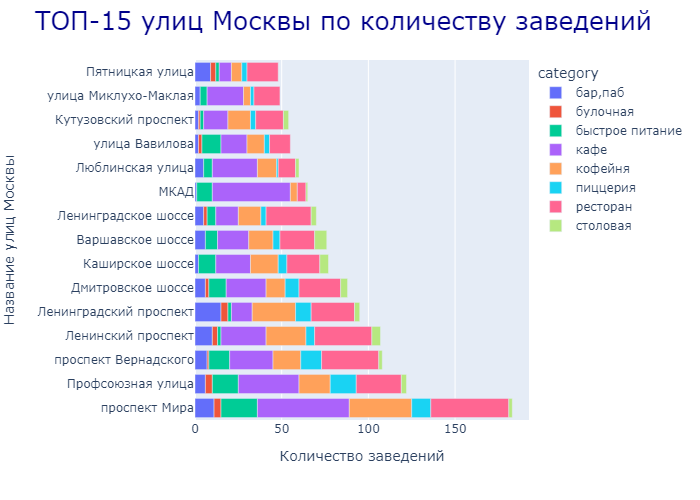

In [58]:
fig = px.bar(places_street, x="amount_of_category", y="street", color='category', orientation='h')
fig.update_layout(dict(title='ТОП-15 улиц Москвы по количеству заведений' + '\n', titlefont_size=25, titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Количество заведений',
                 yaxis_title='Название улиц Москвы')
fig.show()

#### Вывод

ТОП-15 улиц с наибольшим количеством заведений:

1. проспект Мира
2. Профсоюзная улица
3. проспект Вернадского
4. Ленинский проспект
5. Ленинградский проспект
6. Дмитровское шоссе
7. Каширское шоссе
8. Варшавское шоссе
9. Ленинградское шоссе
10. МКАД
11. Люблинская улица
12. улица Вавилова
13. Кутузовский проспект
14. улица Миклухо-Маклая
15. Пятницкая улица

В основной части данных улиц преобладающими категориями заведений являются кафе, ресторан, кофейня, быстрое питание, но на МКАДе это преимущественно кафе.

На Ленинградсокм шоссе, Ленинградском проспекте, Ленинском проспекте, проспекте Вернадского лидирующей категорией заведения является ресторан.

### Улицы, на которых находится только один объект общепита

In [59]:
streets_grouped = places.groupby('street')['name'].count().reset_index()
streets_for_one = streets_grouped.query('name == 1')
display(streets_for_one)

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [60]:
print(places['street'].nunique())

1448


In [61]:
streets_for_one = streets_for_one.merge(places[['district', 'category', 'street']], on='street', how='left')
display(streets_for_one)

,street,name,district,category
0,1-й Автозаводский проезд,1,Южный административный округ,кафе
1,1-й Балтийский переулок,1,Северный административный округ,ресторан
2,1-й Варшавский проезд,1,Южный административный округ,кафе
3,1-й Вешняковский проезд,1,Юго-Восточный административный округ,кафе
4,1-й Голутвинский переулок,1,Центральный административный округ,"бар,паб"
...,...,...,...,...
453,улица Шкулёва,1,Юго-Восточный административный округ,ресторан
454,улица Шкулёва 4,1,Юго-Восточный административный округ,кофейня
455,улица Шухова,1,Южный административный округ,ресторан
456,улица Юннатов,1,Северный административный округ,столовая


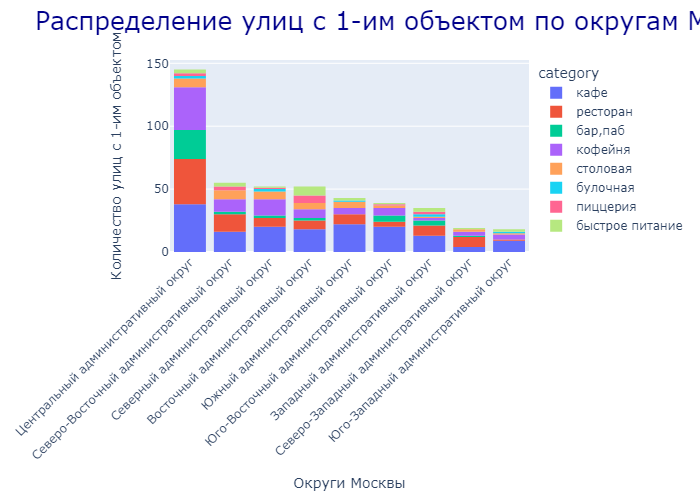

In [62]:
fig = px.histogram(streets_for_one, x="district", color='category')
fig.update_layout(dict(title='Распределение улиц с 1-им объектом по округам Москвы' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Округи Москвы',
                 yaxis_title='Количество улиц с 1-им объектом')
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()

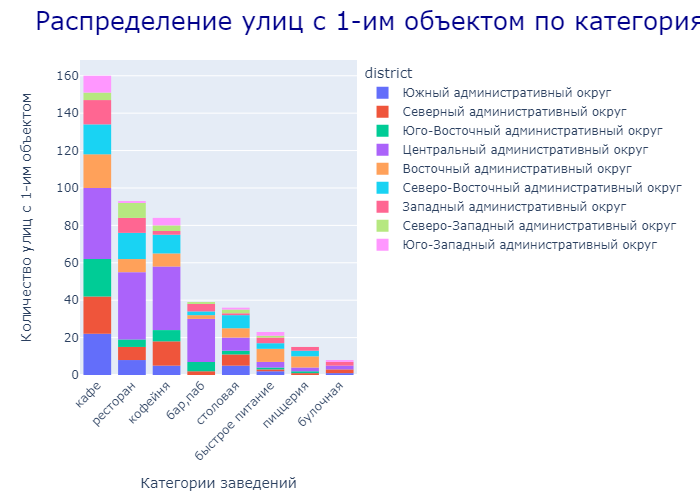

In [63]:
fig = px.histogram(streets_for_one, x="category", color='district')
fig.update_layout(dict(title='Распределение улиц с 1-им объектом по категориям заведений' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Категории заведений',
                 yaxis_title='Количество улиц с 1-им объектом')
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()

#### Вывод

В датасете присутствует **458 улиц, на которых находится всего одно заведение обещственного питания. Это составляет 31.63% от общего количества улиц, представленных в датасете.**

Большая часть этих улиц находится в ЦАО. Это ожидаемый результат, так как в ЦАО количество заведений на более чем 100% больше чем количество заведений в других округах. В СВАО, САО и ВАО количество таких улиц примерно одинаковое, порядка 50. Меньше всего таких улиц в СЗАО.

По категориям заведений больше всего на таких улицах расположены кафе. Количество кафе на улицах с 1-им заведением - 160. Далее идут заведения категорий ресторан - 93, кофейня - 84, бар,паб - 40 и другие. Меньше всего показатели у категории булочная - 8 заведений.
    

### Анализ средних чеков заведений

Рассмотрим средние чеки по районам. Найдем медиану среднего чека по каждому административному округу Москвы. 

Построим фоновую картограмму (хороплет) с полученными значениями для каждого округа

In [64]:
middle_bill = places.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
display(middle_bill)

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [65]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data = districts_geo,
    data=middle_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Медианный средний чек по Москве'
    ).add_to(m)

m

In [66]:
#напишем функцию определения расстояния между 2-мя точками по формуле Гаверсинуса
def distance_1(La1, La2, Lo1, Lo2): 
    Lo1 = radians(Lo1) 
    Lo2 = radians(Lo2) 
    La1 = radians(La1) 
    La2 = radians(La2) 
       
    # Используем "Haversine formula" 
    D_Lo = Lo2 - Lo1 
    D_La = La2 - La1 
    P = sin(D_La / 2)**2 + cos(La1) * cos(La2) * sin(D_Lo / 2)**2 
  
    Q = 2 * asin(sqrt(P)) 
     
    # Радиус земли в км 
    R_km = 6371 
       
    # Результат в км 
    return(Q * R_km) 

la1 = 55.75
lo1 = 36.618
la2 = 55.878
lo2 = 37.478

print(distance_1(la1, la2, lo1, lo2))


55.58409614934618


In [67]:
#получим срез данных из основного Датафрейма и добавим столбец с расстоянием до центра

places_distance = places[['name', 'middle_avg_bill', 'lat', 'lng']]

distance = []

for index, row in places_distance.iterrows():
    distance.append(distance_1(55.751244, row['lat'], 37.618423, row['lng']))
    
display(distance)

[16.620433205090404,
 16.18210118529905,
 16.387082192215267,
 16.60263166880099,
 17.896070743937884,
 16.658649117358948,
 16.58164193541947,
 16.577320258062997,
 15.15710775345685,
 15.374263965408998,
 16.8844734001165,
 16.512895029208256,
 17.684723252847196,
 15.67780296427102,
 15.956304552353682,
 16.890615926537794,
 15.685163346065725,
 17.49690553497062,
 16.11887942306684,
 16.502208995202555,
 17.843702642577068,
 16.93791660783245,
 16.064978120115576,
 16.285170241656292,
 16.674905895852653,
 17.263029752726805,
 15.04324128690387,
 16.652874905530528,
 17.38331967532694,
 17.095325213209676,
 15.804701495418918,
 16.634721520765357,
 15.232845492867623,
 16.238843817978402,
 16.214066903712347,
 15.588722810040446,
 15.856504445597418,
 16.51369544327313,
 16.563106869511966,
 15.90691968995081,
 17.03091472518068,
 16.607754832160197,
 15.577638887954919,
 20.348667784287915,
 15.22084047155127,
 16.340443868284744,
 16.329018653958276,
 16.44889472468191,
 16.61228

In [68]:
places_distance['distance'] = distance
display(places_distance.head())

,name,middle_avg_bill,lat,lng,distance
0,WoWфли,NaN,55.878494,37.478860,16.620433
1,Четыре комнаты,1550.0,55.875801,37.484479,16.182101
2,Хазри,1000.0,55.889146,37.525901,16.387082
3,Dormouse Coffee Shop,NaN,55.881608,37.488860,16.602632
4,Иль Марко,500.0,55.881166,37.449357,17.896071


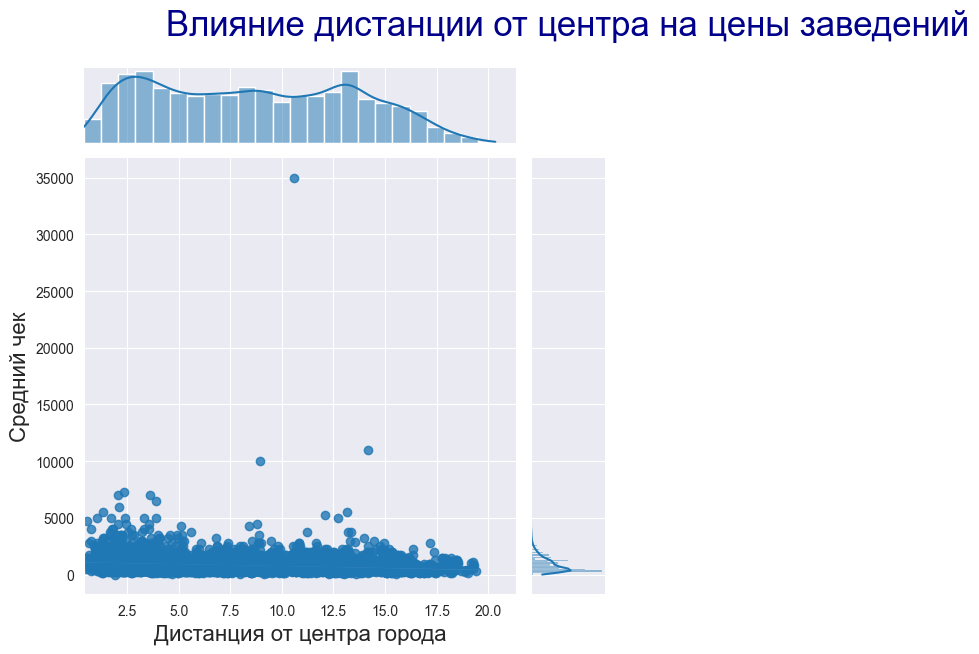

In [69]:
#Посмотрим, есть ли корреляция между средним чеком и расстоянием от центра

d = sns.jointplot(x='distance', y='middle_avg_bill', data=places_distance, kind='reg')
d.set_axis_labels('Дистанция от центра города', 'Средний чек', fontsize=16)
plt.title('Влияние дистанции от центра на цены заведений' + "\n"*3, fontsize=25, color='darkblue');

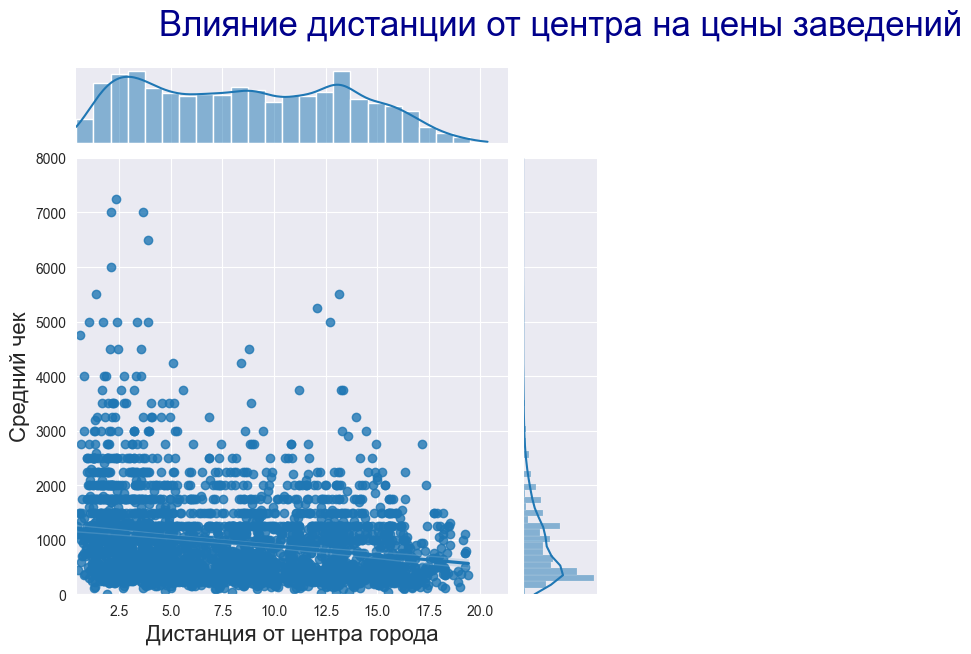

In [70]:
d2=sns.jointplot(x='distance', y='middle_avg_bill', data=places_distance, kind='reg')
plt.ylim(0, 8000)
d2.set_axis_labels('Дистанция от центра города', 'Средний чек', fontsize=16)
plt.title('Влияние дистанции от центра на цены заведений' + "\n"*3, fontsize=25, color='darkblue');

На графике видна взаимлзвяь между удаленностью заведения от центра города и средним чеком. 
Для наглядности, посчитаем коеффициент корреляции (Коэффициент Пирсона)

In [71]:
print(places_distance['distance'].corr(places_distance['middle_avg_bill']))

-0.16441635129805096


Коэффициент Пирсона показывает очень слабую отрицательную корреляцию между двумя показателями: удаленностью заведения от центра и средним чеком. Отрицательное значение корреляции объясняется тем, что чем ближе заведение к центру (т.е. чем меньше дистанция от центра), тем выше средний чек.

#### Вывод

Рассматривая данные удаленности заведений от центра Москвы и средних чеков, приходим к выводу, что взаимосвязь между этими двумя показателями если и есть, то очень слабая. Взаимосвязь слабая и отрицательная, то есть чем меньше дистанция между заведением и центром Москвы, тем выше средний чек.

В связи с этим целесообразно пользоваться данными медианных чеков по округам Москвы. Самые высокие медианные чеки в ЦАО и ЗАО (значения одинаковые). Далее иду СЗАО и САО, ЮЗАО и ВАО, СВАО и ЮАО, и самый низкий медианный чек в ЮВАО.

### Общий вывод

Заведения в данном датасете представлены в 8 категориях и распределены следующим образом:

|Место|Категория|Доля%|
|--|--|--|
|1|Кафе|28%|
|2|Ресторан|24%|
|3|Кофейня|17%|
|4|Бар,паб|9%|
|5|Пиццерия|8%|
|6|Быстрое питание|7%|
|7|Столовая|4%|
|8|Булочная|3%|

Как мы видим, **уверенно лидируют такие категории как кафе, ресторан и кофейни**. Остальные 5 категорий составляют в сумме 31% от объема заведений, каждый из них - менее 10%.




**ПОСАДОЧНЫЕ МЕСТА**

Диаграмма размаха категорий заведения по количеству посадочных мест демонстрирует значительное количество выбросов. Исходя из этого, целесообразно учитывать не средние значения количества посадочных мест, а медианные.

Ориентируясь на медианные значения, количество посадочных мест (от большего к меньшему) распределилось следующим образом:
1. ресторан - 85 посадочных мест
2. бар, паб - 83 посадочных места
3. кофейня - 80 посадочных мест
4. столовая - 78 посадочных мест
5. быстрое питание - 65 посадочных мест
6. кафе - 60 посадочных мест
7. пиццерия - 57 посадочных мест
8. булочная - 50 посадочных мест

**Половина значений количества посадочных мест по категориям распределены следующим образом:**

|Место|Категория|Диапазон 50% значений посадочных мест|
|--|--|--|
|1|Ресторан|от 48 до 150 посадочных мест|
|2|Бар,паб|от 48 до 150 посадочных мест|
|3|Кофейня|от 40 до 144 посадочных мест|
|4|Быстрое питание|от 28 до 140 посадочных мест|
|5|Кафе|от 35 до 120 посадочных мест|
|6|Пиццерия|от 30 до 120 посадочных мест|
|7|Булочная|от 25 до 150 посадочных мест|
|8|Столовая|от 40 до 117 посадочных мест|

Следовательно, 3 категории заведений в большинстве своем имеют наибольшие посадочные места, это
1. Ресторан
2. Бар,паб
3. Кофейня

**СЕТЕВЫЕ И НЕСЕТЕВЫЕ ЗАВЕДЕНИЯ**

1. Большая часть заведений явялются несетевыми - 62%.
2. Доля сетевых заведений составляет 38%

Среди сетевых заведений преобладающая часть это заведения категорий кафе, рестораны и кофейня. 

В абсолютном выражении количество сетевых заведений по категориям распределено в следующем порядке:

|категория|количество|
|--|--|
|1. кафе | 779 заведений|
|2. ресторан | 730 заведений|
|3. кафейня | 720 заведений |
|4. пиццерия | 330 заведений |
|5. быстрое питание | 232 заведения |
|6. бар,паба | 169 заведений |
|7. булочная | 157 заведений |
|8. столовая | 88 заведений |

Доля сетевых заведений в каждой категории:
* **62.3% булочных** являются сетевыми.
* также существенные доли у категорий **пиццерия - 52.1%**
* **кофейня - 51%**
* далее идут категории **быстрое питание - 38.5%**
* **ресторан - 35.7%**
* **кафе - 32.8%**
* самые низкие доли сетевых заведений наблюдатся у следующих категорий **столовая - 27.9%**
* **бар,паб - 22.1%**

Таким образом, **в 3-категориях заведений - булочные, пиццерии и кофейни, более 50% заведений являются сетевыми.**



**ТОП-15 ПОПУЛЯРНЫХ СЕТЕЙ**

Мы выделили ТОП-15 крупных сетей, где встречаются как заведения одной категории, так и разных.
Названия сетей во многом знакомые широкому кругу потребителей. Список ТОП-15 сетей по количеству заведений (от наибольшего к меньшему):
1. Шоколадница
2. Домино'с Пицца
3. Додо Пицца
4. One Price Coffee
5. Яндекс Лавка
6. Cofix
7. Prime
8. Хинкальная
9. КОФЕПОРТ
10. Кулинарная лавка братьев Караваевых
11. Теремок
12. Чайхана
13. CofeFest
14. Буханка
15. Му-Му

В данных ТОП-15 сетях преобладают завeдения категории **кофейня**, на втором месте - **ресторан**, на третьем - **пиццерия**. Менее всего встречаются заведения категории **столовая**.

**ЗАВЕДЕНИЯ ПО АДМИНИСТРАТИВНЫМ ОКРУГАМ**

Наблюдения показывают, что по количеству заведений лидирует ЦАО Москвы: количество заведений в ЦАО превышают количество заведений в других округах Москвы в среднем более чем 2 раза. 
Далее по порядку в идут САО, ЮАО, СВАО, ЗАО, ВАО, ЮВА, ЮЗАО, СЗАО.
В округах САО, ЮАО, СВАО, ЗАО, ВАО, ЮВА, ЮЗАО общее количество заведений варьируется 900-709 заведений. В округе СЗАО количество заведений самое низкое - 409. Это на 81.75% меньше чем в ЦАО и как минимум 42.3% меньше чем в остальных округах города Москвы.

По категориям заведений во всех округах, кроме ЦАО и САО, преобладают следующие категории заведений (порядок по количеству заведений)

        - кафе
        - ресторан
        - кофейня
        
        
В САО этот список выглядит следующим образом:

        - кафе
        - кофейня
        - ресторан
        
        
В ЦАО преобладают следующие категории заведений:

        - ресторан
        - кафе
        - кофейня
        - бар,паб

**СРЕДНИЕ РЕЙТИНГИ ПО КАТЕГОРИЯМ ЗАВЕДЕНИЙ**

При рассмотрении значений рейтингов заведений по категориям наблюдаются выбросы.

В оценке рейтингов целесообразно все же учитывать все рейтинги, в том числе и выбросы, поэтому мы будем оперировать в дальнейшем средними рейтингами.

Распределение средних рейтингов (от большего к меньшему) и медианных рейтингов по категориям:
|Место |Категория |Средний рейтинг|Медианный рейтинг|
|:-|:-|-:|-:|
|1  |бар,паб  | 4.39| 4.40|
|2  |пиццерия | 4.30| 4.30|
|3  |ресторан  | 4.29| 4.30|
|4  |кофейня | 4.28| 4.30|
|5  |булочная  | 4.27| 4.30|
|6  |столовая  | 4.21| 4.30|
|7  |кафе  | 4.12| 4.20|
|8  |быстрое питание | 4.05|4.20|


Таким образом, можно сдедать вывод, что **чаще всего высокие рейтинги получают заведения бар,паб, пиццерия, ресторан, кофейня и  булочная**. Заведения категорий столовая, кафе и быстрое питание реже получают высокие рейтинги.

**ТОП-15 УЛИЦ ПО КОЛИЧЕСТВУ ЗАВЕДЕНИЙ**

ТОП-15 улиц с наибольшим количеством заведений:

1. проспект Мира
2. Профсоюзная улица
3. проспект Вернадского
4. Ленинский проспект
5. Ленинградский проспект
6. Дмитровское шоссе
7. Каширское шоссе
8. Варшавское шоссе
9. Ленинградское шоссе
10. МКАД
11. Люблинская улица
12. улица Вавилова
13. Кутузовский проспект
14. улица Миклухо-Маклая
15. Пятницкая улица

В основной части данных улиц преобладающими категориями заведений являются кафе, ресторан, кофейня, быстрое питание, но на МКАДе это преимущественно кафе.

На Ленинградском шоссе, Ленинградском проспекте, Ленинском проспекте, проспекте Вернадского лидирующей категорией заведения является ресторан.

**УЛИЦЫ С 1-ИМ ЗАВЕДЕНИЕМ**

В датасете присутствует **458 улиц, на которых находится всего одно заведение обещственного питания. Это составляет 31.63% от общего количества улиц, представленных в датасете.**

Большая часть этих улиц находится в ЦАО. Это ожидаемый результат, так как в ЦАО количество заведений на более чем 100% больше чем количество заведений в других округах. В СВАО, САО и ВАО количество таких улиц примерно одинаковое, порядка 50. Меньше всего таких улиц в СЗАО.

По категориям заведений больше всего на таких улицах расположены кафе. Количество кафе на улицах с 1-им заведением - 160. Далее идут заведения категорий ресторан - 93, кофейня - 84, бар,паб - 40 и другие. Меньше всего показатели у категории булочная - 8 заведений.

**СРЕДНИЕ ЧЕКИ И УДАЛЕННОСТЬ ОТ ЦЕНТРА**

Рассматривая данные удаленности заведений от центра Москвы и средних чеков, приходим к выводу, что взаимосвязь между этими двумя показателями если и есть, то очень слабая. Взаимосвязь слабая и отрицательная, то есть чем меньше дистанция между заведением и центром Москвы, тем выше средний чек.

В связи с этим целесообразно пользоваться данными медианных чеков по округам Москвы. Самые высокие медианные чеки в ЦАО и ЗАО (значения одинаковые). Далее иду СЗАО и САО, ЮЗАО и ВАО, СВАО и ЮАО, и самый низкий медианный чек в ЮВАО.

## Детализированное исследование: открытие кофейни

In [72]:
coffeeshop = places[places['category'] == 'кофейня']
print('Количество кофеен в датасете:', coffeeshop.shape[0])

Количество кофеен в датасете: 1413


Посмотрим в каких административных округах их больше всего

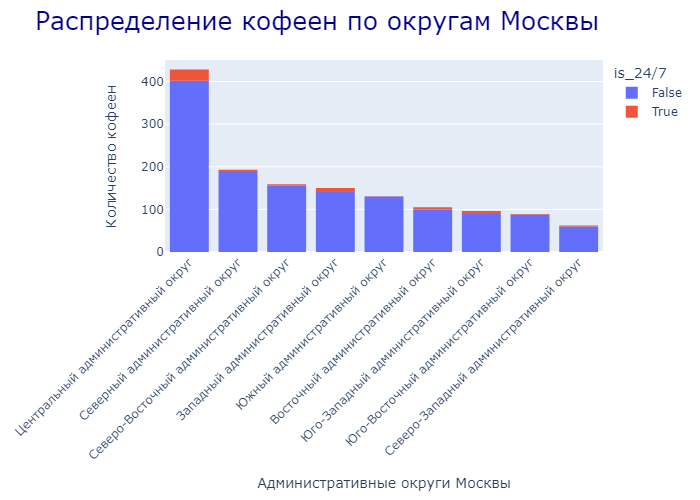

In [73]:
fig = px.histogram(coffeeshop, x="district", color='is_24/7')
fig.update_layout(dict(title='Распределение кофеен по округам Москвы' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Административные округи Москвы',
                 yaxis_title='Количество кофеен')
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()

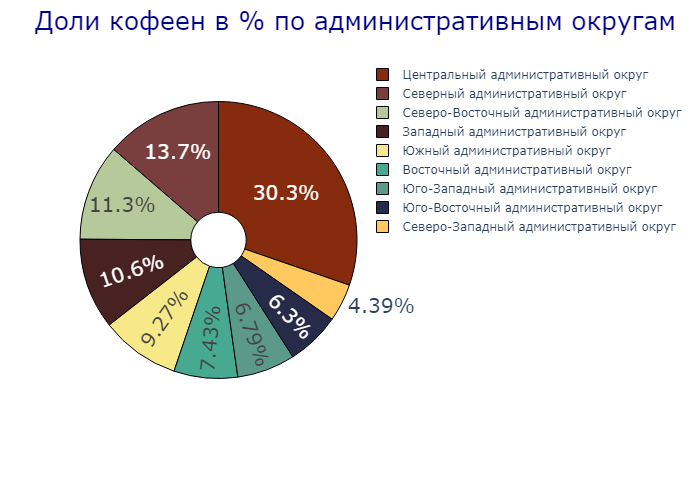

In [74]:
colors = ['#47A992', '#482121', '#7A3E3E', '#B5C99A', '#FFC95F', '#862B0D', '#252B48', '#5B9A8B', '#F7E987']
fig = px.pie(coffeeshop.groupby('district')['name'].count().reset_index(), values='name', \
             names='district', hole=.2)
fig.update_layout(dict(title='Доли кофеен в % по административным округам' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=1)))
fig.show()

Посмотрим на общую долю круглосуточных кофеен

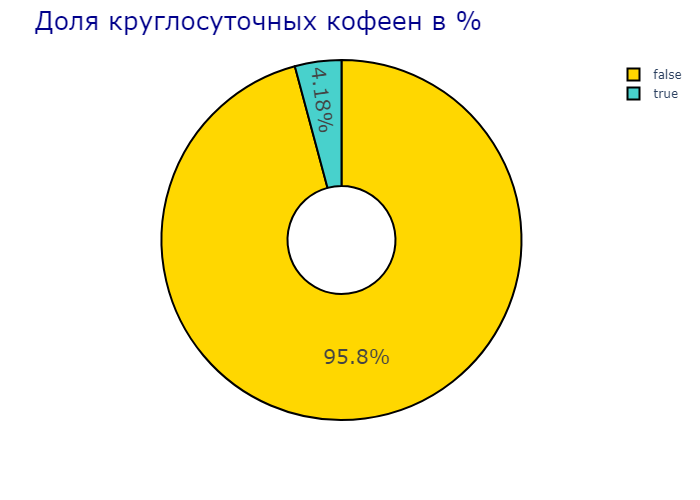

In [75]:
colors = ['gold', 'mediumturquoise']
fig = px.pie(coffeeshop.groupby('is_24/7')['name'].count().reset_index(), values='name', \
             names='is_24/7', hole=.3)
fig.update_layout(dict(title='Доля круглосуточных кофеен в %' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.show()

Посмотрим какие у кофеен рейтинги и как они распространяются по округам.

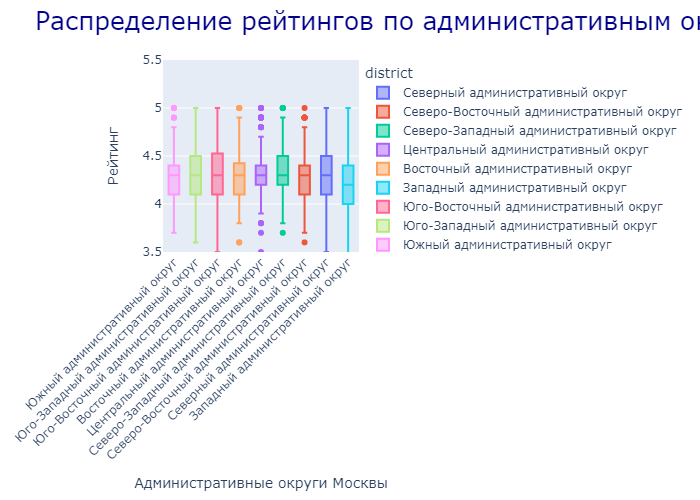

In [76]:
fig = px.box(coffeeshop, y='rating', x='district', color='district')
fig.update_layout(dict(title='Распределение рейтингов по административным округам Москвы' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Административные округи Москвы',
                 yaxis_title='Рейтинг')
fig.update_layout(yaxis_range=[3.5,5.5])
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis={'categoryorder': 'median descending'})
fig.show()

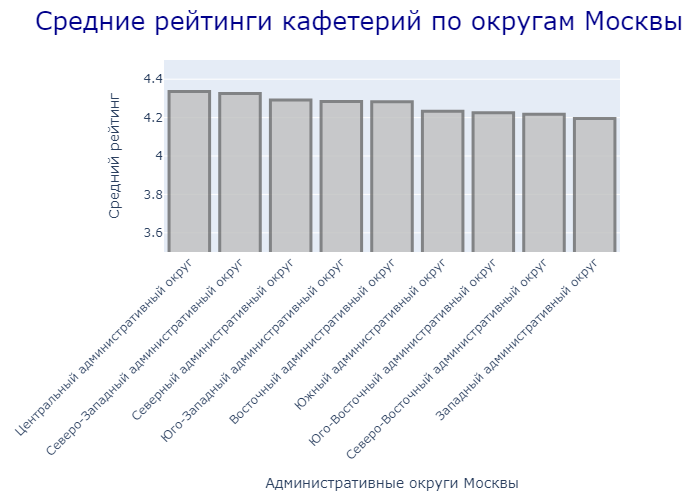

In [77]:

fig = px.bar(coffeeshop.groupby('district')['rating'].mean().reset_index(), x='district', y='rating')
fig.update_layout(dict(title='Средние рейтинги кафетерий по округам Москвы' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Административные округи Москвы',
                 yaxis_title='Средний рейтинг')
fig.update_layout(yaxis_range=[3.5,4.5])
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.update_traces(marker_color='#C0C0C0', marker_line_color='#696969',
                  marker_line_width=3, opacity=0.8)
fig.show()

Посмотрим на среднюю стоимость чашки капучино

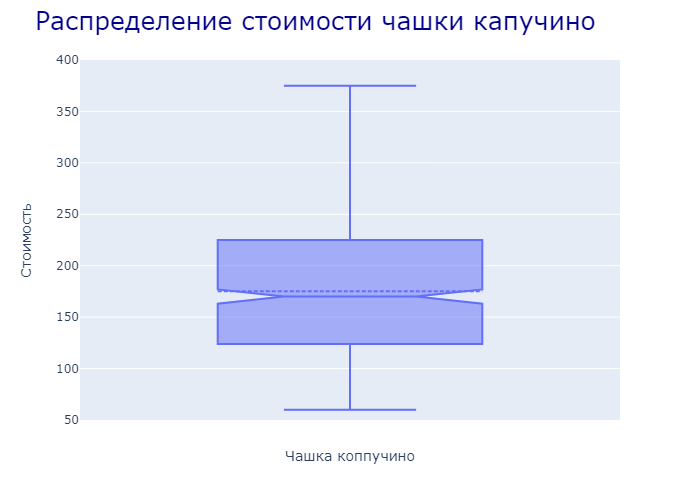

In [78]:
fig = px.box(coffeeshop, y='middle_coffee_cup', notched=True)
fig.update_layout(dict(title='Распределение стоимости чашки капучино' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Чашка коппучино',
                 yaxis_title='Стоимость')
fig.update_layout(yaxis_range=[50,400])
fig.update_traces(boxmean=True)
fig.show()

При выборе стоимости чашки капучино целесообразно опираться на медианное значение, а не среднее. Так как потребитель запоминает стоимость чашки кофе не из расчета средней стоимости кофе в заведениях, которых он был. Потребитель редко производит арифметические расчеты и определяет среднюю стоимость кофе. 

Потребитель запоминает те цены на кофе, которые он чаще всего встречал, и рекордно-низкие или высокие цены на кофе. 

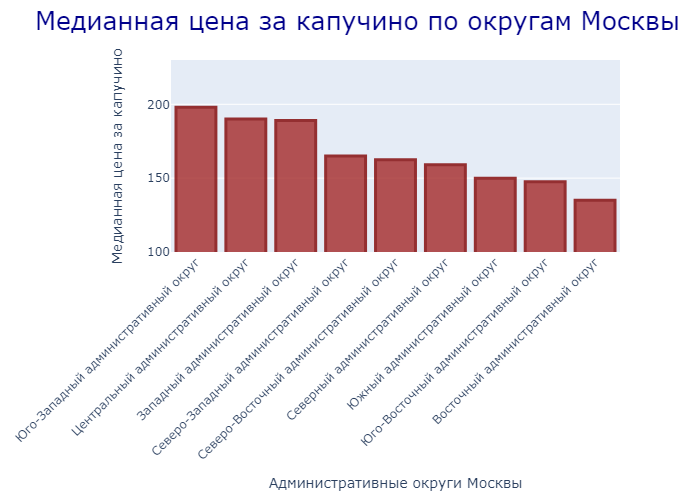

In [79]:
fig = px.bar(coffeeshop.groupby('district')['middle_coffee_cup'].median().reset_index(), x='district', \
             y='middle_coffee_cup')
fig.update_layout(dict(title='Медианная цена за капучино по округам Москвы' + '\n', titlefont_size=25, 
                       titlefont_color='darkblue'))
fig.update_layout(xaxis_title='Административные округи Москвы',
                 yaxis_title='Медианная цена за капучино')
fig.update_layout(yaxis_range=[100,230])
fig.update_xaxes(tickangle=-45)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.update_traces(marker_color='#A52A2A', marker_line_color='#800000',
                  marker_line_width=3, opacity=0.8)
fig.show()

Посмотрим на ТОП_15 улиц с самыми высокими медианными ценами за чашку капучино и ТОП_15 улиц с самыми низкими медианными ценами за чашку капучино
Покажем этим улицы на карте

In [80]:
сoffeeshop_high = coffeeshop.pivot_table(index='street', values=['middle_coffee_cup', 'lat', 'lng'], \
                                        aggfunc={'middle_coffee_cup':'median', 'lat':'first', 'lng':'first'})\
.reset_index().sort_values(by='middle_coffee_cup', ascending=False)
сoffeeshop_high.columns = сoffeeshop_high.columns.str.replace('middle_coffee_cup', 'median_coffee_cup')
сoffeeshop_high = сoffeeshop_high.reset_index().loc[:14]
display(сoffeeshop_high)

,index,street,lat,lng,median_coffee_cup
0,94,Большая Семёновская улица,55.782477,37.702322,851.0
1,88,Большая Никитская улица,55.756507,37.604838,328.0
2,40,3-я Фрунзенская улица,55.719000,37.582203,320.0
3,96,Большая Сухаревская площадь,55.771638,37.636840,300.0
4,83,Богословский переулок,55.762591,37.599530,300.0
5,465,площадь Победы,55.735162,37.517861,291.0
6,519,улица Гарибальди,55.671280,37.554501,291.0
7,32,3-й Крутицкий переулок,55.731914,37.664709,291.0
8,244,Милютинский переулок,55.765695,37.632350,290.0
9,156,Енисейская улица,55.865204,37.661509,287.0


In [81]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data = districts_geo,
    data=coffeeshop.groupby('district')['middle_coffee_cup'].median().reset_index(),
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Медианная чашка капучино по Москве'
    ).add_to(m)

m

marker_cluster=MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['median_coffee_cup']}",
    ).add_to(marker_cluster)

сoffeeshop_high.apply(create_clusters, axis=1)

m

In [82]:
сoffeeshop_low = coffeeshop.pivot_table(index='street', values=['middle_coffee_cup', 'lat', 'lng'], \
                                        aggfunc={'middle_coffee_cup':'median', 'lat':'first', 'lng':'first'})\
.reset_index().sort_values(by='middle_coffee_cup', ascending=True)
сoffeeshop_low.columns = сoffeeshop_low.columns.str.replace('middle_coffee_cup', 'median_coffee_cup')
сoffeeshop_low = сoffeeshop_low.reset_index().loc[:14]
display(сoffeeshop_low)

,index,street,lat,lng,median_coffee_cup
0,414,Химкинский бульвар,55.850811,37.444491,60.0
1,427,Шипиловский проезд,55.612696,37.695943,60.0
2,267,Нижняя Радищевская улица,55.741845,37.653285,60.0
3,198,Краснопрудная улица,55.777882,37.661270,60.0
4,69,Балаклавский проспект,55.640831,37.608969,60.0
5,587,улица Пресненский Вал,55.764731,37.564294,60.0
6,294,Окружной проезд,55.788516,37.744006,60.0
7,576,улица Остоженка,55.738737,37.597088,60.0
8,499,улица Барклая,55.744531,37.497655,60.0
9,538,улица Измайловский Вал,55.783590,37.719197,60.0


In [83]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data = districts_geo,
    data=coffeeshop.groupby('district')['middle_coffee_cup'].median().reset_index(),
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Медианная чашка капучино по Москве'
    ).add_to(m)

m

marker_cluster=MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['median_coffee_cup']}",
    ).add_to(marker_cluster)

сoffeeshop_low.apply(create_clusters, axis=1)

m

### Вывод

1. Количество кофеен в датасете - 1413 заведений
2. Значительная их часть расположена в Центральном административном округе. Доли кафеен по административным округам Москвы выглядят следующим образом:
|Место|Округ|Доля от общего рынка|
|:-|:-|-:|
|1|ЦАО|30.30%|
|2|САО|13.70%|
|3|СВАО|11.30%|
|4|ЗАО|10.60%|
|5|ЮАО|9.27%|
|6|ВАО|7.43%|
|7|ЮЗАО|6.79%|
|8|ЮВАО|6.30%|
|9|СВАО|4.39%|
3. **Доля круглосуточных кофеен** составляет всего **4.18%** от общего количества кофеен.
4. Средние рейтинги кофеен по административным округам однородные: варьируются **от 4.19(ЗАО) до 4.33(ЦАО)**. После ЦАО вторым по рейтингу является СВАО - 4.32.
5. Цена за среднюю чашку капучино распределена следующим образом:
        - Большая часть цен (99.7%) лежит в интервале от 60 до 375 руб.
        - 50% цен лежит в интервале от 124 до 225 руб.
        - Медианная цена за чашку капучино в Москве составляет 170 руб.
        - Средняя цена за чашку капучино в Москве составляет 175 руб.
  
При выборе стоимости чашки капучино целесообразно опираться на медианное значение, а не среднее. Так как потребитель запоминает стоимость чашки кофе не из расчета средней стоимости кофе в заведениях, которых он был. Потребитель редко производит арифметические расчеты и определяет среднюю стоимость кофе. 

Потребитель запоминает те цены на кофе, которые он чаще всего встречал, и рекордно-низкие или высокие цены на кофе.

6. Медианная цена за капучино по округам Москвы распределена следующим образом:
|Место|Округ|Мед.цена за чашку капучино|
|:-|:-|-:|
|1|ЮЗАО|198 руб.|
|2|ЦАО|190 руб.|
|3|ЗАО|189 руб.|
|4|СЗАО|165 руб.|
|5|СВАО|162.5 руб.|
|6|САО|159 руб.|
|7|ЮАО|150 руб.|
|8|ЮВАО|147.5 руб.|
|9|ВАО|135 руб.|

7. Определены ТОП-15 улиц с самыми высокими медианными ценами за чашку капучино. Цена на данных улицах варьируется от 275 руб. (улица Охотный ряд) до 851 руб. (Большая Семеновская улица).

8. Определены ТОП-15 улиц с самыми низкими медианными ценами за чашку капучино. Цена на данных улицах варьируется от 60 руб. (Химкинский бульвар) до 80 руб. (Хорошевское шоссе).

При открытии кофейни стоимость чашки капучино рекомендую определять исходя из медианной стоимости чашки капучино в данном округе Москвы и на конкретной улице. В зависимости от целей бизнеса и позиционирования заведения, также рекомендую рассмотреть вариант определения стоимости чашки капучино незначительно ниже медианной стоимости.



Презентация: <https://disk.yandex.ru/d/04AleS7sk-ugQQ>